## City of Toronto Bicycle Collisions Data



## Setup Notebook

In [1]:
# Import 3rd party libraries
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pylab as plt
import geopandas as gpd
import matplotlib.pyplot as plt
import folium
from IPython.display import display
import geopandas as gpd
from shapely.geometry import Point

# Configure Notebook
%matplotlib inline
plt.style.use('fivethirtyeight')
sns.set_context("notebook")
import warnings
warnings.filterwarnings('ignore')

/Users/aaliyashaikh/Library/Python/3.8/lib/python/site-packages/urllib3/__init__.py:35: NotOpenSSLWarning: urllib3 v2 only supports OpenSSL 1.1.1+, currently the 'ssl' module is compiled with 'LibreSSL 2.8.3'. See: https://github.com/urllib3/urllib3/issues/3020
  warnings.warn(


## Import GeoJson Data

To begin analyzing bicycle collision data, we first need to load the dataset. The data is stored in GeoJSON format, which contains geographical information that can be processed using a GeoDataFrame in the geopandas library. Below, we import the dataset and display the first few rows to get an overview of the data structure:

In [2]:
# Import dataset as a GeoDataFrame
collision_data = gpd.read_file('../../data_files/Traffic_Collisions_Open_Data_-6024052409346627848.geojson')

collision_data.head()


,OBJECTID,EVENT_UNIQUE_ID,OCC_DATE,OCC_MONTH,OCC_DOW,OCC_YEAR,OCC_HOUR,DIVISION,FATALITIES,INJURY_COLLISIONS,...,HOOD_158,NEIGHBOURHOOD_158,LONG_WGS84,LAT_WGS84,AUTOMOBILE,MOTORCYCLE,PASSENGER,BICYCLE,PEDESTRIAN,geometry
0,1,GO-20148000005,"Wed, 01 Jan 2014 05:00:00 GMT",January,Wednesday,2014,13,D23,0,NO,...,006,Kingsview Village-The Westway (6),-79.558639,43.694246,YES,NO,NO,NO,NO,POINT (-79.55864 43.69425)
1,2,GO-20148000085,"Wed, 01 Jan 2014 05:00:00 GMT",January,Wednesday,2014,19,D42,0,NO,...,128,Agincourt South-Malvern West (128),-79.281506,43.784746,YES,NO,NO,NO,NO,POINT (-79.28151 43.78475)
2,3,GO-20141260499,"Wed, 01 Jan 2014 05:00:00 GMT",January,Wednesday,2014,2,NSA,0,YES,...,NSA,NSA,0.000000,0.000000,YES,NO,NO,NO,NO,POINT (0.00000 0.00000)
3,4,GO-20141260663,"Wed, 01 Jan 2014 05:00:00 GMT",January,Wednesday,2014,3,NSA,0,NO,...,NSA,NSA,0.000000,0.000000,YES,NO,NO,NO,NO,POINT (0.00000 0.00000)
4,5,GO-20141261162,"Wed, 01 Jan 2014 05:00:00 GMT",January,Wednesday,2014,5,NSA,0,YES,...,NSA,NSA,0.000000,0.000000,YES,NO,NO,NO,NO,POINT (0.00000 0.00000)


We can see that there are a lot of collisions in the City of Toronto. Now let's analyze that data in the dataset. 

## Data Analysis

Let's exploring the collision data columns (features).

In [3]:
# Check the number of columns and rows
collision_data.shape

(704704, 22)

In [4]:
# Check the columns in DataFrame
collision_data.columns

Index(['OBJECTID', 'EVENT_UNIQUE_ID', 'OCC_DATE', 'OCC_MONTH', 'OCC_DOW',
       'OCC_YEAR', 'OCC_HOUR', 'DIVISION', 'FATALITIES', 'INJURY_COLLISIONS',
       'FTR_COLLISIONS', 'PD_COLLISIONS', 'HOOD_158', 'NEIGHBOURHOOD_158',
       'LONG_WGS84', 'LAT_WGS84', 'AUTOMOBILE', 'MOTORCYCLE', 'PASSENGER',
       'BICYCLE', 'PEDESTRIAN', 'geometry'],
      dtype='object')

Based on the Toronto Police Service's Traffic Collisions Open Data (ASR-T-TBL-001), here is a description of each column in the dataset:

- OBJECTID: A unique identifier for each collision record.
- EVENT_UNIQUE_ID: A unique code assigned to each specific event.
- OCC_DATE: The date and time of the collision occurrence.
- OCC_MONTH: The month in which the collision occurred.
- OCC_DOW: The day of the week on which the collision happened.
- OCC_YEAR: The year in which the collision occurred.
- OCC_HOUR: The hour of the day (24-hour format) when the collision took place.
- DIVISION: The division code where the incident was recorded.
- FATALITIES: The number of fatalities resulting from the collision.
- INJURY_COLLISIONS: Indicates whether the collision involved injuries (e.g., "YES" or "NO").
- FTR_COLLISIONS: Indicates whether the collision was a "Fail to Remain" incident.
- PD_COLLISIONS: Indicates whether the collision involved property damage.
- HOOD_158: Numeric code representing the neighborhood where the collision occurred.
- NEIGHBOURHOOD_158: The name of the neighborhood and its associated number.
- LONG_WGS84: Longitude of the collision location (in WGS84 coordinate system).
- LAT_WGS84: Latitude of the collision location (in WGS84 coordinate system).
- AUTOMOBILE: Indicates if an automobile was involved in the collision (e.g., "YES" or "NO").
- MOTORCYCLE: Indicates if a motorcycle was involved in the collision.
- PASSENGER: Indicates if a passenger vehicle was involved in the collision.
- BICYCLE: Indicates if a bicycle was involved in the collision.
- PEDESTRIAN: Indicates if a pedestrian was involved in the collision.
- geometry: A spatial coordinate (likely projected coordinate system) for mapping the location.


In [5]:
# Check data types per column
print(collision_data.dtypes)

OBJECTID                int64
EVENT_UNIQUE_ID        object
OCC_DATE               object
OCC_MONTH              object
OCC_DOW                object
OCC_YEAR               object
OCC_HOUR               object
DIVISION               object
FATALITIES              int64
INJURY_COLLISIONS      object
FTR_COLLISIONS         object
PD_COLLISIONS          object
HOOD_158               object
NEIGHBOURHOOD_158      object
LONG_WGS84            float64
LAT_WGS84             float64
AUTOMOBILE             object
MOTORCYCLE             object
PASSENGER              object
BICYCLE                object
PEDESTRIAN             object
geometry             geometry
dtype: object


In [6]:
# Check numerical statistics for each column
collision_data.describe()

,OBJECTID,FATALITIES,LONG_WGS84,LAT_WGS84
count,704704.000000,704704.000000,704704.000000,704704.000000
mean,352352.500000,0.000873,-66.342691,36.528215
std,203430.666387,0.030053,29.423231,16.200397
min,1.000000,0.000000,-79.639247,0.000000
25%,176176.750000,0.000000,-79.444829,43.644346
50%,352352.500000,0.000000,-79.370469,43.692500
75%,528528.250000,0.000000,-79.258521,43.751480
max,704704.000000,3.000000,0.000000,43.853164


Because werw focusing on bicycle collision drop eveeyrhting but bicylcle. 


In [7]:
# Drop columns
collision_data = collision_data.drop(columns=[
    'OBJECTID',               # Unique identifier, not informative for analysis
    'EVENT_UNIQUE_ID',        # Another unique identifier, redundant
    'HOOD_158',               # Numeric code for neighborhoods, redundant with neighborhood name
    'INJURY_COLLISIONS',      # Specific collision categories, may not fit broader analysis
    'NEIGHBOURHOOD_158',      # Redundant if detailed spatial analysis isn't required
    'OCC_MONTH',              # Month derivable from OCC_DATE
    'OCC_YEAR',               # Year derivable from OCC_DATE
    'OCC_DOW',                # Day of week derivable from OCC_DATE
    'DIVISION',               # Redundant for neighborhood-focused analysis
    'PASSENGER',              # Overlaps with automobile classification
    'AUTOMOBILE',             # May be less relevant if focusing on broader vehicle data
    'FATALITIES',             # May not fit broad collision trends
    'FTR_COLLISIONS',         # Specific collision subcategories
    'PD_COLLISIONS',          # Specific collision subcategories
    'MOTORCYCLE',             # May not fit focus of general collision analysis
    'PEDESTRIAN',             # May not fit focus of general collision analysis
], errors='ignore')

# Rename columns in the GeoDataFrame
collision_data.rename(columns={
    'OCC_DATE': 'DATE',            # Rename to better indicate the data's purpose
    'LONG_WGS84': 'LONGITUDE',     # Simplify and clarify the name
    'LAT_WGS84': 'LATITUDE',       # Simplify and clarify the name
    'OCC_HOUR': 'HOUR'             # Rename for consistency
}, inplace=True)

# Check if columns are removed and remaining columns have been renamed
collision_data.columns


Index(['DATE', 'HOUR', 'LONGITUDE', 'LATITUDE', 'BICYCLE', 'geometry'], dtype='object')

## Data Cleaning

Data cleaning for the collision dataset ensures:

- Accuracy: Removes errors and inconsistencies.
- Efficiency: Streamlines the dataset for quicker and easier analysis.
- Reliability: Produces trustworthy insights and recommendations.
- Focus: Tailors the data for the specific analysis of collision patterns and trends.

Given the large size of the traffic collision dataset, it would be inefficient to work with the entire dataset when we're only interested in data from 2019 to 2023. To streamline our analysis, we will filter the dataset to focus solely on the relevant records from these years. This approach reduces the amount of data we're working with and helps optimize processing time. The following code extracts only the collisions that occurred between 2019 and 2023, dropping any other records:

In [8]:
# Convert the 'collision_date' column to datetime (replace 'collision_date' with the actual column name)
collision_data['DATE'] = pd.to_datetime(collision_data['DATE'])

# Filter data from 2019 to 2023 and drop all other entries
collision_data_filtered = collision_data[(collision_data['DATE'].dt.year >= 2014) & 
                                         (collision_data['DATE'].dt.year <= 2023)]

# Verify the results by displaying the first few rows
collision_data_filtered.head()


,DATE,HOUR,LONGITUDE,LATITUDE,BICYCLE,geometry
0,2014-01-01 05:00:00,13,-79.558639,43.694246,NO,POINT (-79.55864 43.69425)
1,2014-01-01 05:00:00,19,-79.281506,43.784746,NO,POINT (-79.28151 43.78475)
2,2014-01-01 05:00:00,2,0.000000,0.000000,NO,POINT (0.00000 0.00000)
3,2014-01-01 05:00:00,3,0.000000,0.000000,NO,POINT (0.00000 0.00000)
4,2014-01-01 05:00:00,5,0.000000,0.000000,NO,POINT (0.00000 0.00000)


Before proceeding with any analysis, it's important to check the dataset for missing values. Missing or incomplete data can lead to inaccurate results or errors in processing. The following code will help us identify if there are any missing values in the traffic collision dataset and show the number of missing entries for each column:

In [9]:
# Check for missing values
print(collision_data_filtered.isnull().sum())

# Drop rows with any NaN values
collision_data_clean = collision_data_filtered.dropna()

# Verify the result by checking the number of missing values after dropping NaNs
print(collision_data_clean.isnull().sum())

DATE         0
HOUR         0
LONGITUDE    0
LATITUDE     0
BICYCLE      4
geometry     0
dtype: int64
DATE         0
HOUR         0
LONGITUDE    0
LATITUDE     0
BICYCLE      0
geometry     0
dtype: int64


Although there are no missing values there are several collisions that dont have coordinates or have 'no'.

In [10]:
# Drop rows where LONGITUDE or LATITUDE values are 0 or BICYCLE is 'NO' or 'N/R'
collision_data_bicycles = collision_data_filtered[
    (collision_data_filtered['LONGITUDE'] != 0) & 
    (collision_data_filtered['LATITUDE'] != 0) & 
    (collision_data_filtered['BICYCLE'] != 'NO') &
    (collision_data_filtered['BICYCLE'] != 'N/R')
]

# Verify the results by displaying the first few rows
collision_data_bicycles.head()

,DATE,HOUR,LONGITUDE,LATITUDE,BICYCLE,geometry
89,2014-01-02 05:00:00,18,-79.380272,43.648644,YES,POINT (-79.38027 43.64864)
351,2014-01-03 05:00:00,11,-79.399845,43.652539,YES,POINT (-79.39984 43.65254)
1857,2014-01-09 05:00:00,13,-79.405167,43.656966,YES,POINT (-79.40517 43.65697)
1891,2014-01-09 05:00:00,5,-79.480613,43.665578,YES,POINT (-79.48061 43.66558)
2271,2014-01-12 05:00:00,22,-79.377892,43.649143,YES,POINT (-79.37789 43.64914)


** EXPLAIN WHY IM DROPPING THE COLLISIONS WITH POINT (0,0)

Since there is no missing data, we don't need to handle any specific missing values. 

To get an overview of the size of the dataset, it's useful to check the number of rows and columns it contains. The following code will display the shape of the traffic collision dataset, which will tell us how many entries (rows) and features (columns) are present:

In [11]:
collision_data_bicycles.shape

(9393, 6)

Initially, I planned to remove duplicates as part of the data cleaning process. However, it's not advisable to drop duplicates in this dataset because multiple collisions can occur at the same time or at the same geographical coordinates (longitude and latitude). To ensure the integrity of the data, I chose not to remove any duplicates. I would typically  also remove outliers using the Interquartile Range method. However, outliers in traffic collision datasets often represent rare but significant events that can provide valuable insights. Removing these data points without careful consideration might undermine the depth and accuracy of the analysis, potentially overlooking critical patterns or impactful incidents.

That is all for data cleaning, let's see the new size of the dataset.

In [12]:
# View DataFrame
collision_data_bicycles.tail()

,DATE,HOUR,LONGITUDE,LATITUDE,BICYCLE,geometry
652614,2023-12-29 05:00:00,18,-79.251249,43.718836,YES,POINT (-79.25125 43.71884)
652678,2023-12-29 05:00:00,9,-79.422689,43.654396,YES,POINT (-79.42269 43.65440)
652848,2023-12-30 05:00:00,13,-79.388216,43.666811,YES,POINT (-79.38822 43.66681)
652851,2023-12-30 05:00:00,11,-79.273974,43.822500,YES,POINT (-79.27397 43.82250)
652881,2023-12-31 05:00:00,12,-79.429433,43.652967,YES,POINT (-79.42943 43.65297)


In [13]:
output_path = "../Clean Data/collision_data.geojson"
collision_data_bicycles.to_file(output_path, driver="GeoJSON")

## Visualization of Filtered Dataset

To visualize the traffic collision data, we can use the folium library, which allows for interactive mapping with geographical data. In this section, we'll create a base map centered on Toronto and overlay the traffic collision data from the GeoJSON file. The following code ensures that the data is correctly loaded and visualized on the map, with error handling to check for any issues with the file path:

In [14]:
# Define Toronto's latitude and longitude
toronto_coords = [43.65107, -79.347015]

# Create a folium map centered on Toronto
m = folium.Map(location=toronto_coords, zoom_start=12)

# Add each collision from collision_data_filtered to the map
for _, row in collision_data_bicycles.iterrows():
    folium.CircleMarker(
      location=[row['LATITUDE'], row['LONGITUDE']],
      radius=1,  # Size of the marker
      color='blue',  # Border color
      fill=True,
      fill_color='blue',  # Fill color
      fill_opacity=0.6  # Transparency
    ).add_to(m)

# Add a layer control panel
folium.LayerControl().add_to(m)

# Display the map
m

#colour code by year

## Exploratory Data Analysis of Collisions Data from 2019 to 2023

### Extracted Time Features from Collision Data

After converting the `DATE` column to a proper datetime format, we extracted several time-based attributes to analyze collision patterns more effectively. The following features were derived:

1. **Year**: The year in which the collision occurred.
2. **Month**: The month of the collision (1 = January, 12 = December).
3. **Day of the Week**: The name of the day (e.g., Monday, Tuesday).
4. **Hour**: The hour of the day when the collision occurred (0-23).

These features allow for temporal analysis of the data, such as identifying trends over years, seasonal patterns, or the most common days and hours for collisions. For example, examining collisions by the day of the week can help identify whether weekdays or weekends experience more accidents, while the hour attribute can reveal peak traffic or high-risk hours.


In [15]:
# Ensure the DATE column is in datetime format
collision_data_bicycles['DATE'] = pd.to_datetime(collision_data_bicycles['DATE'], errors='coerce')

# Extract year, month, and day of the week
collision_data_bicycles['Year'] = collision_data_bicycles['DATE'].dt.year
collision_data_bicycles['Month'] = collision_data_bicycles['DATE'].dt.month
collision_data_bicycles['Day Of Week'] = collision_data_bicycles['DATE'].dt.day_name()

# Drop the time portion in the DATE column
collision_data_bicycles['DATE'] = collision_data_bicycles['DATE'].dt.date

# Display the filtered DataFrame
collision_data_bicycles.head()

,DATE,HOUR,LONGITUDE,LATITUDE,BICYCLE,geometry,Year,Month,Day Of Week
89,2014-01-02,18,-79.380272,43.648644,YES,POINT (-79.38027 43.64864),2014,1,Thursday
351,2014-01-03,11,-79.399845,43.652539,YES,POINT (-79.39984 43.65254),2014,1,Friday
1857,2014-01-09,13,-79.405167,43.656966,YES,POINT (-79.40517 43.65697),2014,1,Thursday
1891,2014-01-09,5,-79.480613,43.665578,YES,POINT (-79.48061 43.66558),2014,1,Thursday
2271,2014-01-12,22,-79.377892,43.649143,YES,POINT (-79.37789 43.64914),2014,1,Sunday


### Yearly Collision Trends Analysis

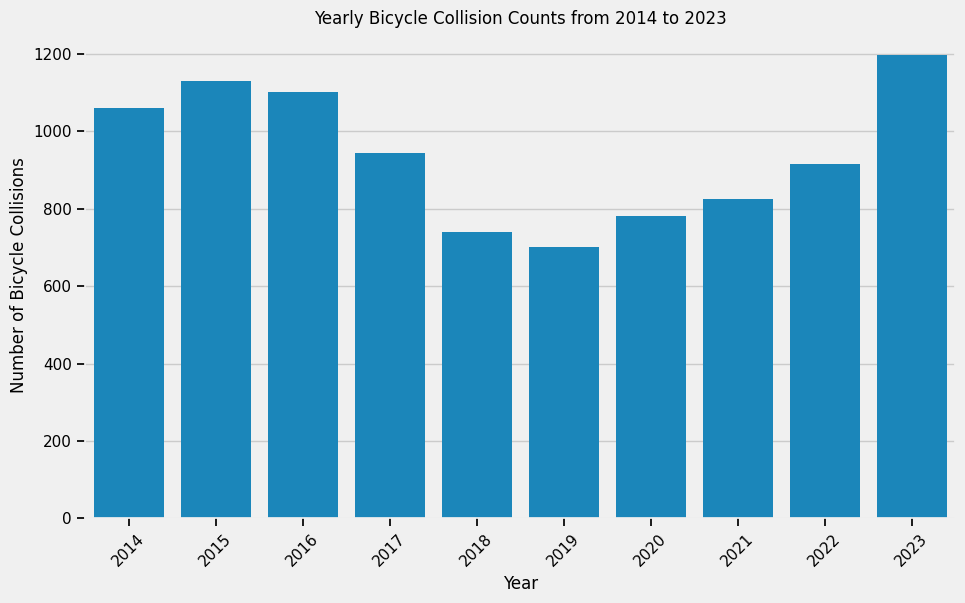

In [16]:
# Plot collisions per year from 2014 to 2023 for bicycles only
plt.figure(figsize=(10, 6))
sns.countplot(x='Year', data=collision_data_bicycles)
plt.title('Yearly Bicycle Collision Counts from 2014 to 2023')
plt.xlabel('Year')
plt.ylabel('Number of Bicycle Collisions')
plt.xticks(rotation=45)
plt.show()

# change colour palette


### Monthly Collision Patterns 


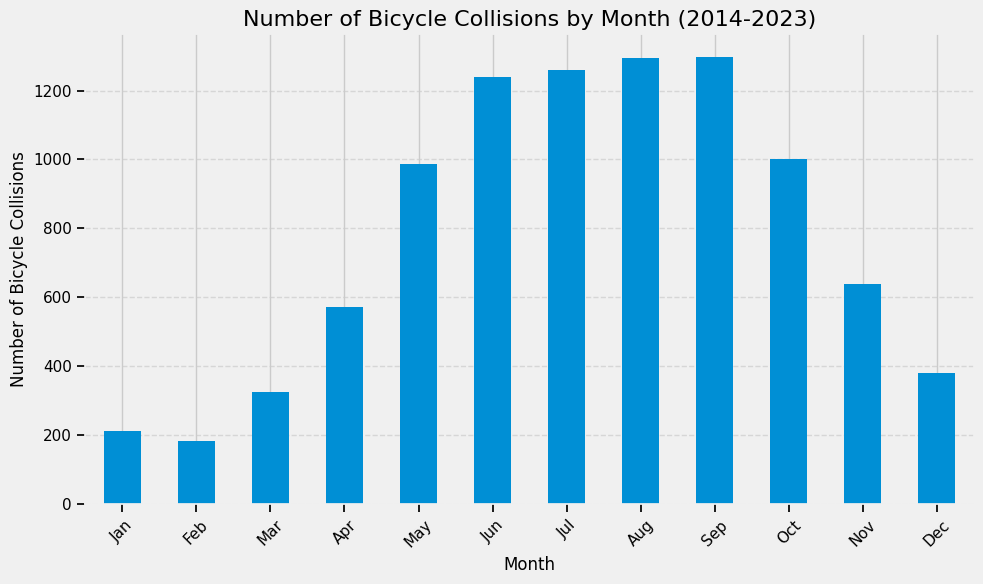

In [17]:
# Plot collisions per month
plt.figure(figsize=(10, 6))
collision_data_bicycles["Month"].value_counts(sort=False).plot(kind="bar")
plt.title("Number of Bicycle Collisions by Month (2014-2023)", fontsize=16)
plt.xlabel("Month", fontsize=12)
plt.ylabel("Number of Bicycle Collisions", fontsize=12)
plt.xticks(ticks=range(0, 12), labels=["Jan", "Feb", "Mar", "Apr", "May", "Jun", "Jul", "Aug", "Sep", "Oct", "Nov", "Dec"], rotation=45)
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.tight_layout()

# Show the plot
plt.show()

# change the colour of each bar by season 

#### Relationship between Month and Year

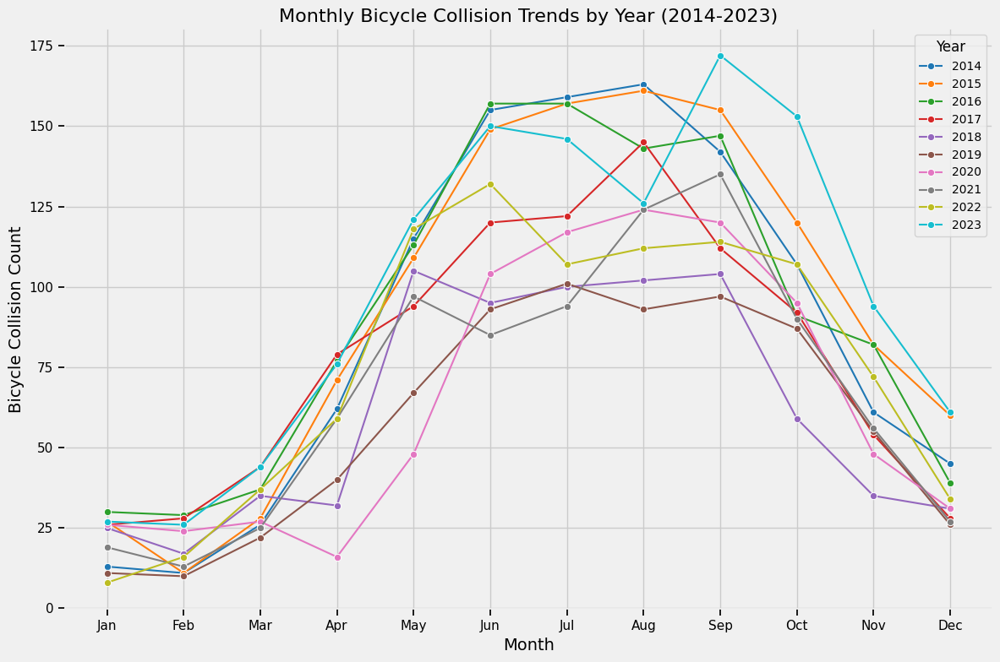

In [18]:
# Group data by Year and Month, and count collisions
monthly_collision_counts = collision_data_bicycles.groupby(['Year', 'Month']).size().reset_index(name='Bicycle_Collision_Count')

# Create a line plot with a custom color palette
plt.figure(figsize=(12, 8))
sns.lineplot(
    data=monthly_collision_counts,
    x='Month',
    y='Bicycle_Collision_Count',
    hue='Year',
    marker='o',
    palette='tab10'  
)

# Customize the plot
plt.title("Monthly Bicycle Collision Trends by Year (2014-2023)", fontsize=16)
plt.xlabel("Month", fontsize=14)
plt.ylabel("Bicycle Collision Count", fontsize=14)
plt.xticks(ticks=range(1, 13), labels=["Jan", "Feb", "Mar", "Apr", "May", "Jun", "Jul", "Aug", "Sep", "Oct", "Nov", "Dec"])
plt.legend(title="Year", fontsize=10, title_fontsize=12)
plt.grid(True)

# Show the plot
plt.tight_layout()
plt.show()

#take hist plot from above and put it in the back of this graph

### Day of the Week Collision Pattern

To further analyze collision patterns, we will examine how collisions are distributed across different days of the week. This analysis can help uncover trends related to weekly activities, such as increased traffic on weekdays due to work commutes or higher collision counts on weekends due to leisure travel. By visualizing these patterns, we can better understand how daily behaviors influence road safety and identify high-risk days for implementing targeted interventions.

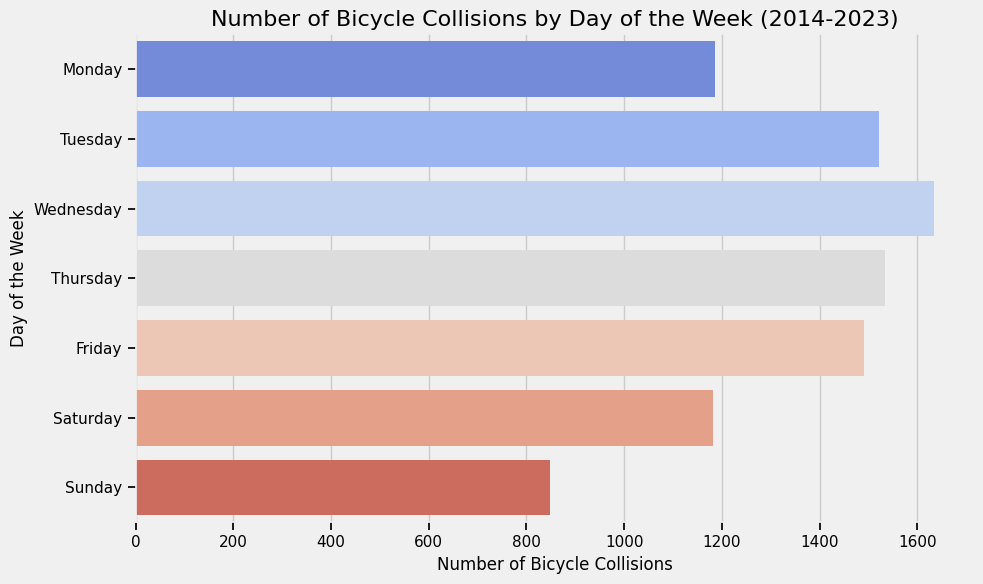

In [19]:
# Count the number of collisions for each day of the week
collisions_by_day = collision_data_bicycles['Day Of Week'].value_counts()

# Reorder the days to follow the traditional weekly order
day_order = ['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday']
collisions_by_day = collisions_by_day.reindex(day_order)

# Create a horizontal bar plot for better readability
plt.figure(figsize=(10, 6))
sns.barplot(x=collisions_by_day, y=collisions_by_day.index, palette='coolwarm')  # Color palette for better visuals
plt.title('Number of Bicycle Collisions by Day of the Week (2014-2023)', fontsize=16)
plt.xlabel('Number of Bicycle Collisions', fontsize=12)
plt.ylabel('Day of the Week', fontsize=12)
plt.tight_layout()

# Display the plot
plt.show()

#hexplot 

###  Time of the Day Collision Patterns

This section of the analysis focuses on understanding the hourly patterns of traffic collisions. By examining how collisions are distributed across different hours of the day, we can identify peak times when accidents are most likely to occur. This insight is critical for implementing targeted traffic safety measures, optimizing resource allocation for emergency responders, and improving road safety during high-risk periods. The following code aggregates collision data by hour and visualizes these patterns to uncover meaningful trends.

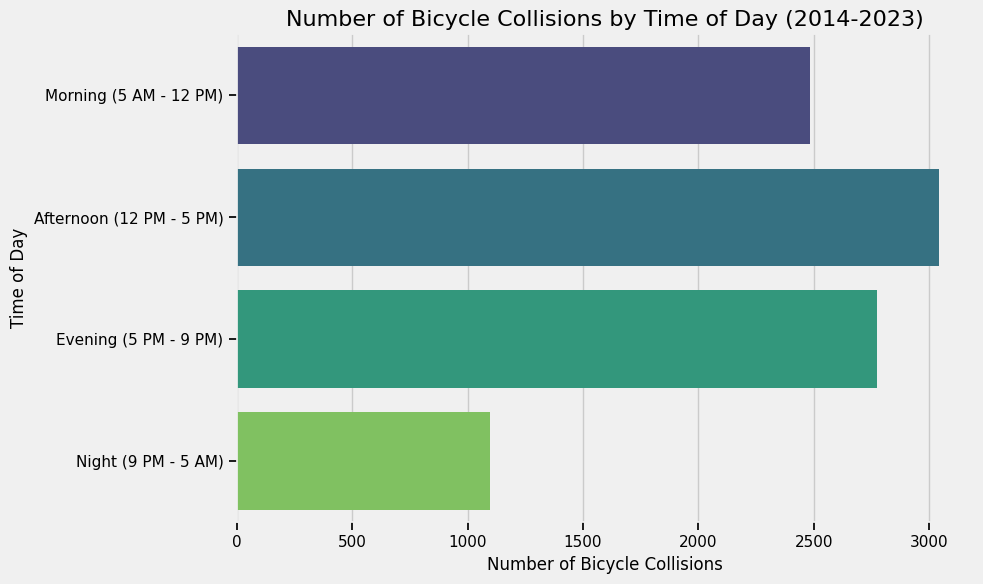

In [20]:
# Ensure the 'HOUR' column is converted to integers
collision_data_bicycles['HOUR'] = collision_data_bicycles['HOUR'].astype(int)

# Define time categories based on the hour of the day
def categorize_time(hour):
    if 5 <= hour < 12:
        return 'Morning (5 AM - 12 PM)'
    elif 12 <= hour < 17:
        return 'Afternoon (12 PM - 5 PM)'
    elif 17 <= hour < 21:
        return 'Evening (5 PM - 9 PM)'
    else:
        return 'Night (9 PM - 5 AM)'

# Apply the time categorization to the 'HOUR' column
collision_data_bicycles['TIME_OF_DAY'] = collision_data_bicycles['HOUR'].apply(categorize_time)

# Count collisions for each time category
collisions_by_time_of_day = collision_data_bicycles['TIME_OF_DAY'].value_counts()

# Reorder categories for logical time progression
time_order = ['Morning (5 AM - 12 PM)', 'Afternoon (12 PM - 5 PM)', 'Evening (5 PM - 9 PM)', 'Night (9 PM - 5 AM)']
collisions_by_time_of_day = collisions_by_time_of_day.reindex(time_order)

# Create a horizontal bar plot for better readability
plt.figure(figsize=(10, 6))
sns.barplot(x=collisions_by_time_of_day, y=collisions_by_time_of_day.index, palette='viridis')  # Color palette for better visuals
plt.title('Number of Bicycle Collisions by Time of Day (2014-2023)', fontsize=16)
plt.xlabel('Number of Bicycle Collisions', fontsize=12)
plt.ylabel('Time of Day', fontsize=12)
plt.tight_layout()

# Display the plot
plt.show()


### Relationship between Time of Day and Day of the Week

## Import Ward Data

In [39]:
# Load the GeoJSON file generated (adjust the path if needed)
ward_data = gpd.read_file('../Clean Data/wards_data.geojson')  

# View geoDataFrame
ward_data.head(25)

,AREA_ID,AREA_TYPE,AREA_S_CD,AREA_NAME,X,Y,LONGITUDE,LATITUDE,geometry
0,2551040,WD18,16,Don Valley East,318237.290,4844000.0,-79.33298,43.739716,"POLYGON ((-79.31335 43.71699, -79.31950 43.715..."
1,2551044,WD18,03,Etobicoke-Lakeshore,303099.474,4831000.0,-79.52087,43.621646,"POLYGON ((-79.49777 43.65198, -79.49725 43.651..."
2,2551048,WD18,15,Don Valley West,314825.876,4843000.0,-79.37536,43.728396,"POLYGON ((-79.35232 43.71573, -79.35209 43.715..."
3,2551052,WD18,23,Scarborough North,324522.149,4852000.0,-79.25467,43.809672,"POLYGON ((-79.22591 43.83960, -79.22556 43.839..."
4,2551056,WD18,11,University-Rosedale,313306.543,4837000.0,-79.39432,43.671139,"POLYGON ((-79.39004 43.69050, -79.39004 43.690..."
5,2551035,WD18,10,Spadina-Fort York,313874.844,4833000.0,-79.38733,43.635801,"POLYGON ((-79.38377 43.65572, -79.38320 43.654..."
6,2551039,WD18,09,Davenport,309296.325,4836000.0,-79.44405,43.669353,"POLYGON ((-79.44642 43.68625, -79.44612 43.685..."
7,2551037,WD18,05,York South-Weston,305318.582,4839000.0,-79.49337,43.694951,"POLYGON ((-79.46935 43.70868, -79.46888 43.706..."
8,2551041,WD18,17,Don Valley North,316048.951,4850000.0,-79.36004,43.787602,"POLYGON ((-79.38349 43.76408, -79.38715 43.763..."
9,2551042,WD18,08,Eglinton-Lawrence,310114.447,4842000.0,-79.43385,43.718315,"POLYGON ((-79.46457 43.69217, -79.46462 43.692..."


## Ward Data Analysis 

In [26]:
# Check the number of columns and rows
ward_data.shape

(25, 9)

In [27]:
# Check the columns in DataFrame
ward_data.columns

Index(['AREA_ID', 'AREA_TYPE', 'AREA_S_CD', 'AREA_NAME', 'X', 'Y', 'LONGITUDE',
       'LATITUDE', 'geometry'],
      dtype='object')

## Ward Data Cleaning

Since the data was already cleaned lets just drop columns we don't need

In [28]:
# Drop unnecessary columns 
ward_data = ward_data.drop(columns = ['AREA_ID', 'AREA_TYPE', 'X', 'Y', 'LONGITUDE', 'LATITUDE'], errors='ignore')

# Rename columns in the GeoDataFrame
ward_data.rename(columns={
    'AREA_S_CD':'Ward Number',
    'AREA_NAME':'Ward Name'            
}, inplace=True)

# Check the columnsare dropped in geoDataFrame
ward_data.columns

Index(['Ward Number', 'Ward Name', 'geometry'], dtype='object')

In [29]:
# View geoDataFrame
ward_data.head(25)

,Ward Number,Ward Name,geometry
0,16,Don Valley East,"POLYGON ((-79.31335 43.71699, -79.31950 43.715..."
1,03,Etobicoke-Lakeshore,"POLYGON ((-79.49777 43.65198, -79.49725 43.651..."
2,15,Don Valley West,"POLYGON ((-79.35232 43.71573, -79.35209 43.715..."
3,23,Scarborough North,"POLYGON ((-79.22591 43.83960, -79.22556 43.839..."
4,11,University-Rosedale,"POLYGON ((-79.39004 43.69050, -79.39004 43.690..."
5,10,Spadina-Fort York,"POLYGON ((-79.38377 43.65572, -79.38320 43.654..."
6,09,Davenport,"POLYGON ((-79.44642 43.68625, -79.44612 43.685..."
7,05,York South-Weston,"POLYGON ((-79.46935 43.70868, -79.46888 43.706..."
8,17,Don Valley North,"POLYGON ((-79.38349 43.76408, -79.38715 43.763..."
9,08,Eglinton-Lawrence,"POLYGON ((-79.46457 43.69217, -79.46462 43.692..."


## Overlay Collision Data onto Ward Data 


In [30]:
# Convert collision data to GeoDataFrame
collision_data_bicycles["geometry"] = collision_data_bicycles.apply(lambda row: Point(row["LONGITUDE"], row["LATITUDE"]), axis=1)
collision_data_bicycles = gpd.GeoDataFrame(collision_data_bicycles, geometry="geometry", crs="EPSG:4326")

In [28]:
# Ensure CRS matches
if collision_data_bicycles.crs != ward_data.crs:
    collision_data_bicycles = collision_data_bicycles.to_crs(ward_data.crs)

# Visualize on a map
map_wards = folium.Map(location=[43.7, -79.4], zoom_start=11)
ward_data_json = ward_data.to_json()
folium.GeoJson(ward_data_json, name="Wards").add_to(map_wards)

# Add collision points
for _, row in collision_data_bicycles.iterrows():
    folium.CircleMarker(
        location=[row.geometry.y, row.geometry.x],
        radius=1,
        color="red",
        fill=True,
        fill_color="red",
        fill_opacity=0.6
    ).add_to(map_wards)

map_wards

In [31]:
# Perform the spatial join to find which ward each collision occurred in
collision_with_wards = gpd.sjoin(collision_data_bicycles, ward_data, how="left", op="within")

# Drop unnecessary geometry columns for tabular display
collision_table = collision_with_wards.drop(columns=["geometry", "index_right"])

# Rename columns in the GeoDataFrame
collision_table.rename(columns={
    'AREA_TYPE': 'Ward_Number',           
    'AREA_NAME': 'Ward_Name'
}, inplace=True)

# Display the table in the notebook
collision_table.tail()  # Display first few rows of the table

,DATE,HOUR,LONGITUDE,LATITUDE,BICYCLE,Year,Month,Day Of Week,TIME_OF_DAY,Ward Number,Ward Name
652614,2023-12-29,18,-79.251249,43.718836,YES,2023,12,Friday,Evening (5 PM - 9 PM),20,Scarborough Southwest
652678,2023-12-29,9,-79.422689,43.654396,YES,2023,12,Friday,Morning (5 AM - 12 PM),11,University-Rosedale
652848,2023-12-30,13,-79.388216,43.666811,YES,2023,12,Saturday,Afternoon (12 PM - 5 PM),13,Toronto Centre
652851,2023-12-30,11,-79.273974,43.822500,YES,2023,12,Saturday,Morning (5 AM - 12 PM),23,Scarborough North
652881,2023-12-31,12,-79.429433,43.652967,YES,2023,12,Sunday,Afternoon (12 PM - 5 PM),09,Davenport


In [30]:
# Convert 'DATE' field to string to avoid compatibility issues
if 'DATE' in collision_table.columns:
    collision_table['DATE'] = collision_table['DATE'].astype(str)

# Ensure 'geometry' column exists for GeoDataFrame compatibility
if 'geometry' not in collision_table.columns:
    collision_table['geometry'] = collision_table.apply(
        lambda row: Point(row['LONGITUDE'], row['LATITUDE']), axis=1
    )

# Convert to GeoDataFrame
collision_table_geo = gpd.GeoDataFrame(collision_table, geometry=collision_table['geometry'], crs="EPSG:4326")

# Save the GeoDataFrame to a GeoJSON file
output_geojson_path = "collision_data_with_wards.geojson"
collision_table_geo.to_file(output_geojson_path, driver="GeoJSON")


## Exploratory Data Analysis with Bicyle Collision and Ward Data (2019 to 2023)



In [32]:
# Define the region mapping based on the provided wards
ward_region_mapping = {
    "Downtown Toronto": [
        "Spadina-Fort York", "Toronto Centre", "University-Rosedale", "St. Paul's", "Scarborough Southwest",
        "Scarborough Centre", "Scarborough-Guildwood"
    ],
    "East Toronto": [
        "Beaches-East York", "Scarborough East", "Scarborough North", "Scarborough Rouge Park", 
        "Scarborough Agincourt"
    ],
    "North York": [
        "Don Valley North", "York Centre", "Don Valley West", "Eglinton-Lawrence", "Willowdale", 
        "Bathurst-Manor", "York Mills", "Humber River-Black Creek"
    ],
    "West Toronto": [
        "Etobicoke-Lakeshore", "Etobicoke North", "York South-Weston", "Davenport", "Parkdale-High Park", 
        "High Park-Junction", "Junction Triangle"
    ]
}

# Function to assign region based on the ward name
def assign_region(ward_name):
    # Ensure the ward_name is a string, in case of NaN or float
    if isinstance(ward_name, str):
        ward_name = ward_name.strip().title()  # Clean up and standardize the string
        for region, wards in ward_region_mapping.items():
            if ward_name in wards:
                return region
    return "Unknown Region"  # In case a ward name doesn't match any region

# Assuming 'collision_table' is your existing DataFrame
# Apply the function to the 'WARD NAME' column to create a new 'Region' column
collision_table['Region'] = collision_table['Ward Name'].apply(assign_region)

# Display the updated table with the 'Region' column added
collision_table.head()

,DATE,HOUR,LONGITUDE,LATITUDE,BICYCLE,Year,Month,Day Of Week,TIME_OF_DAY,Ward Number,Ward Name,Region
89,2014-01-02,18,-79.380272,43.648644,YES,2014,1,Thursday,Evening (5 PM - 9 PM),13,Toronto Centre,Downtown Toronto
351,2014-01-03,11,-79.399845,43.652539,YES,2014,1,Friday,Morning (5 AM - 12 PM),10,Spadina-Fort York,Downtown Toronto
1857,2014-01-09,13,-79.405167,43.656966,YES,2014,1,Thursday,Afternoon (12 PM - 5 PM),11,University-Rosedale,Downtown Toronto
1891,2014-01-09,5,-79.480613,43.665578,YES,2014,1,Thursday,Morning (5 AM - 12 PM),04,Parkdale-High Park,West Toronto
2271,2014-01-12,22,-79.377892,43.649143,YES,2014,1,Sunday,Night (9 PM - 5 AM),13,Toronto Centre,Downtown Toronto


### Bicycle Collisions Across Wards from 2019 to 2023

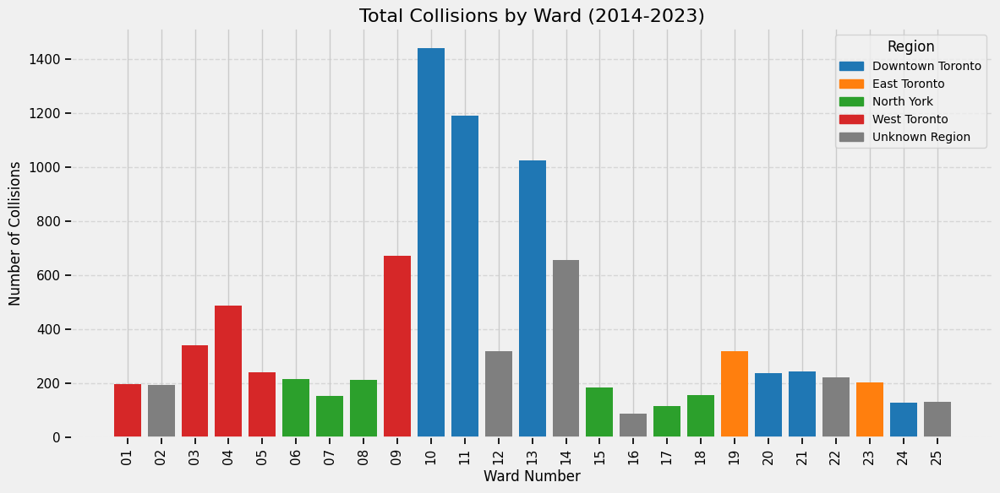

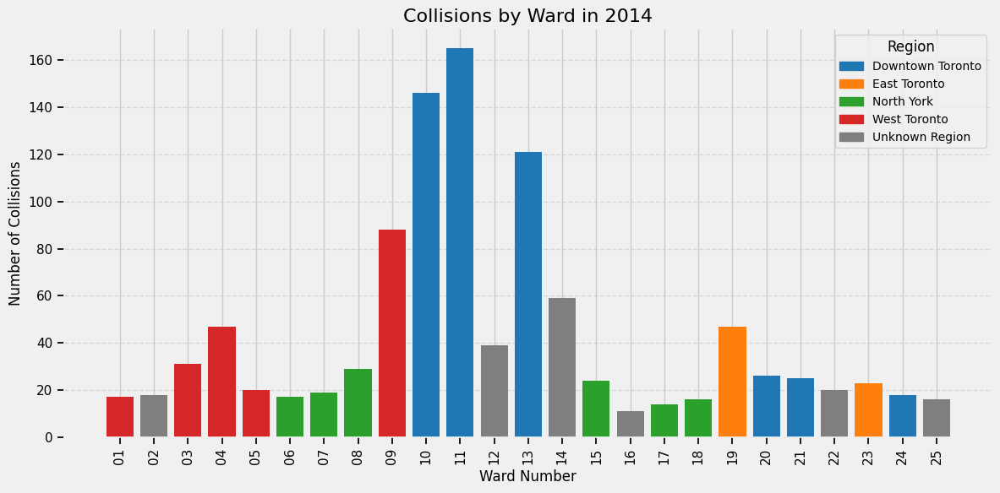

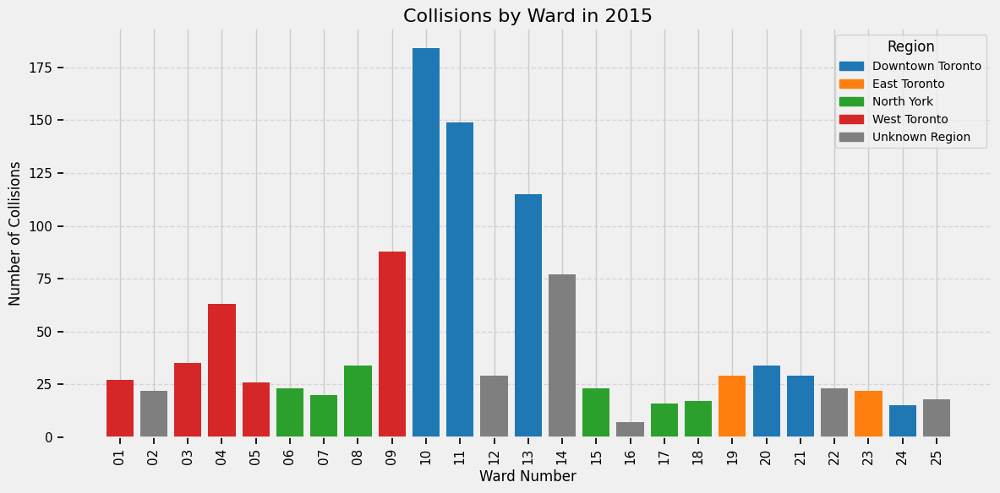

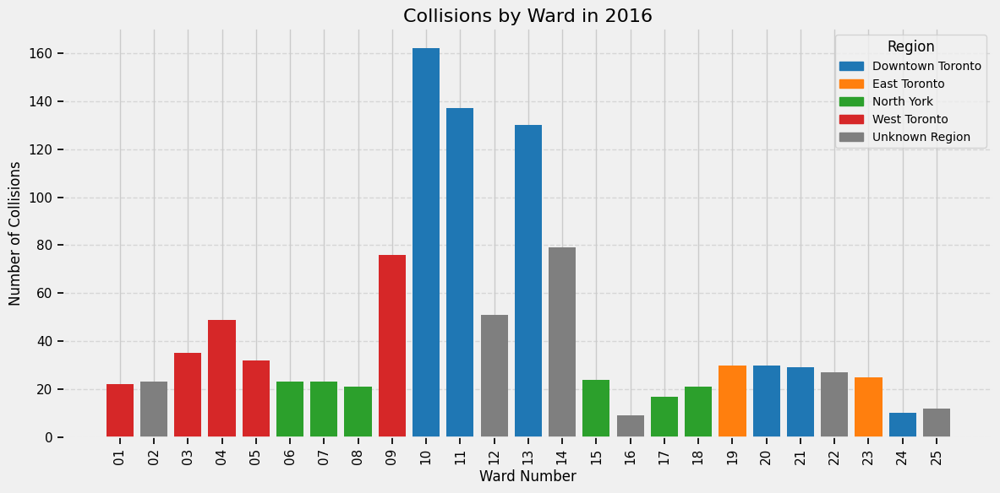

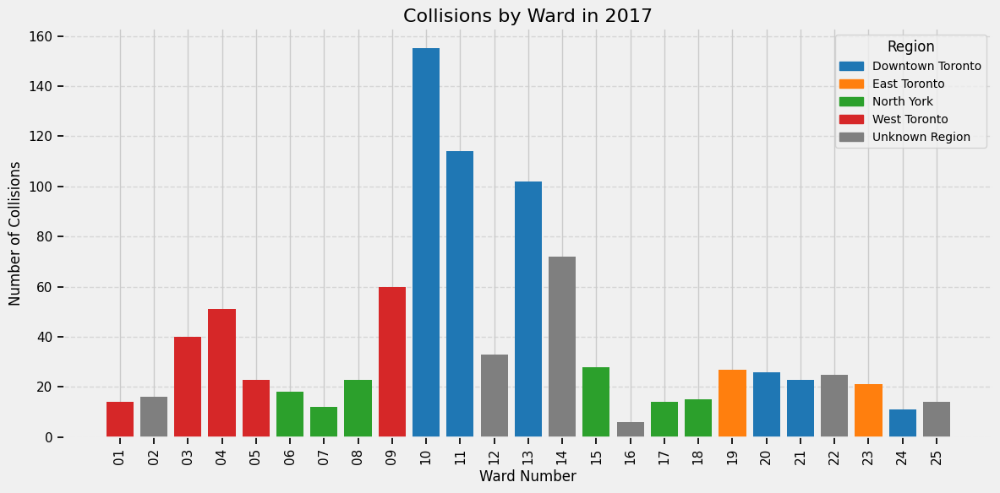

...

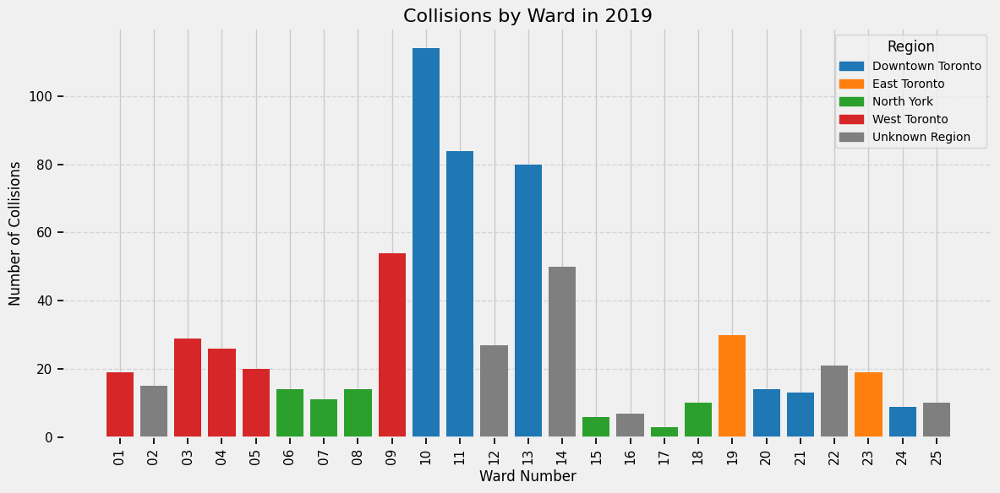

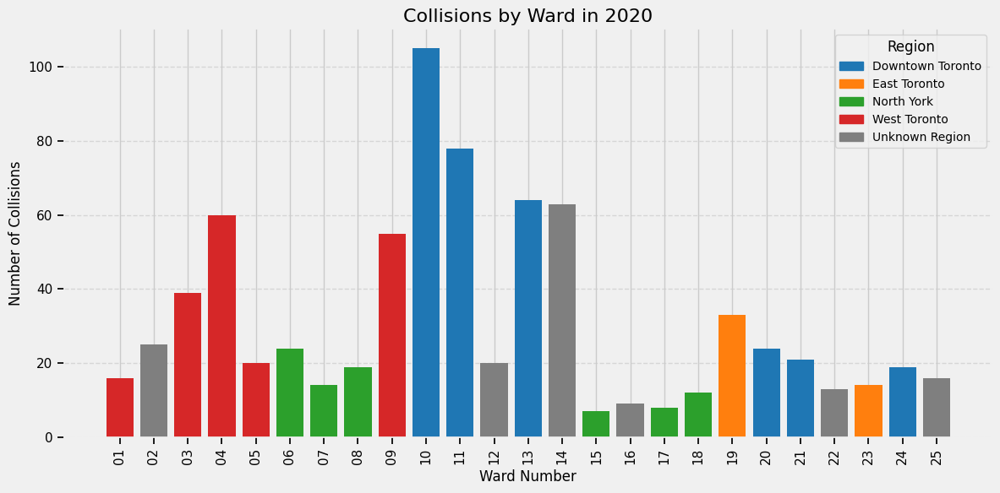

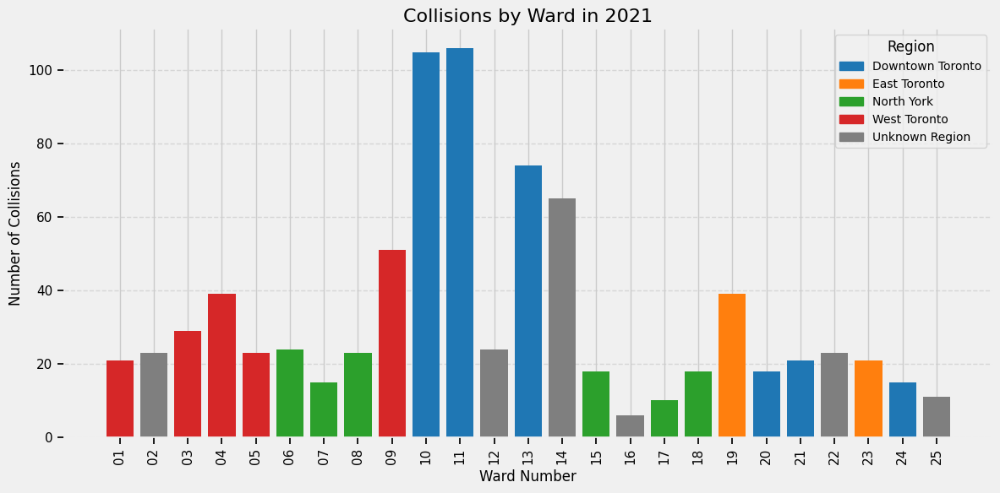

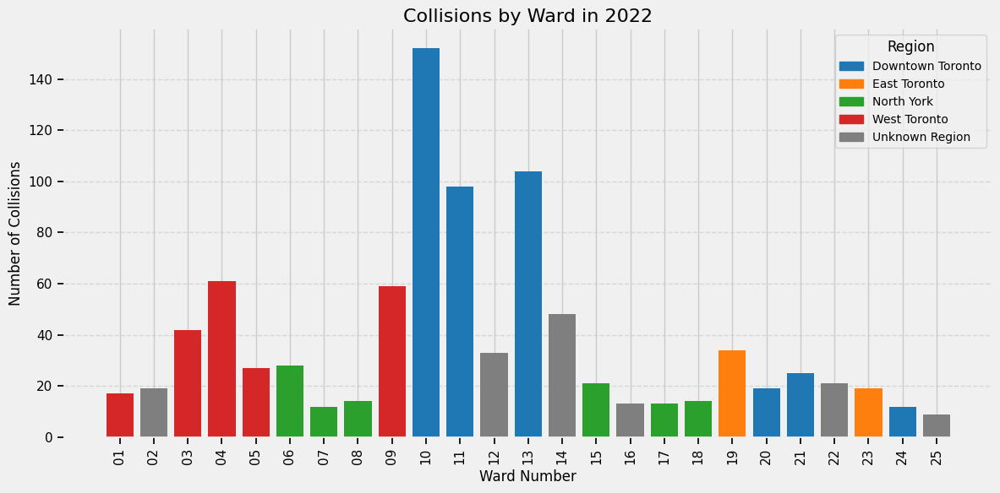

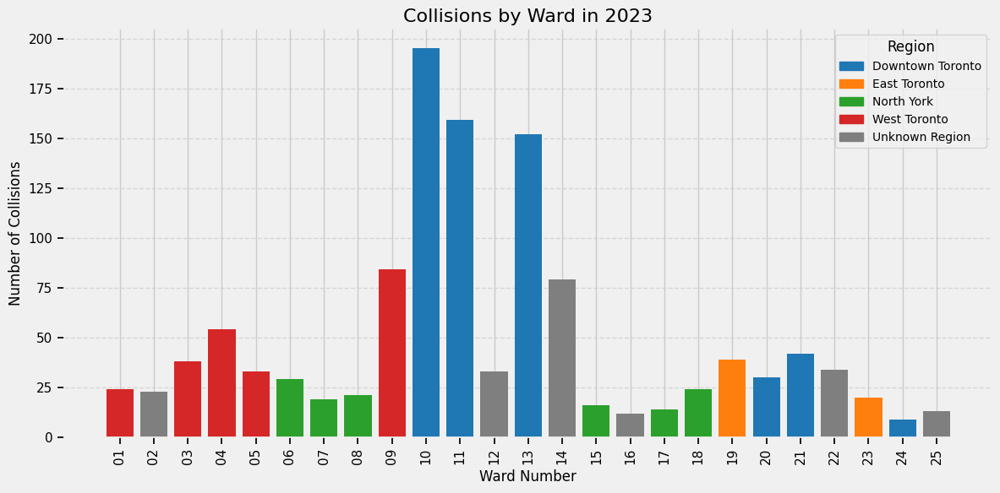

Year               2014  2015  2016  2017  2018  2019  2020  2021  2022  2023
Ward Name                                                                    
Beaches-East York    47    29    30    27    11    30    33    39    34    39
Davenport            88    88    76    60    58    54    55    51    59    84
Don Valley East      11     7     9     6     7     7     9     6    13    12
Don Valley North     14    16    17    14     7     3     8    10    13    14
Don Valley West      24    23    24    28    16     6     7    18    21    16


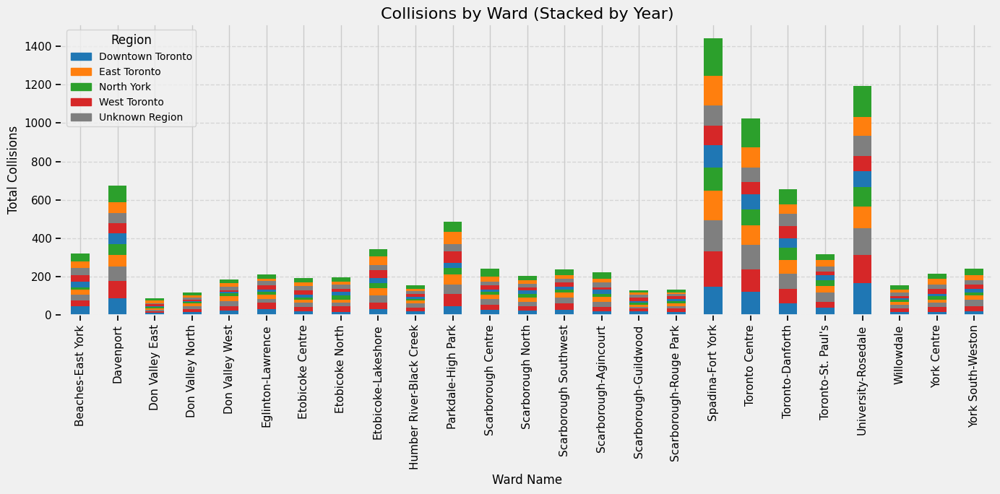

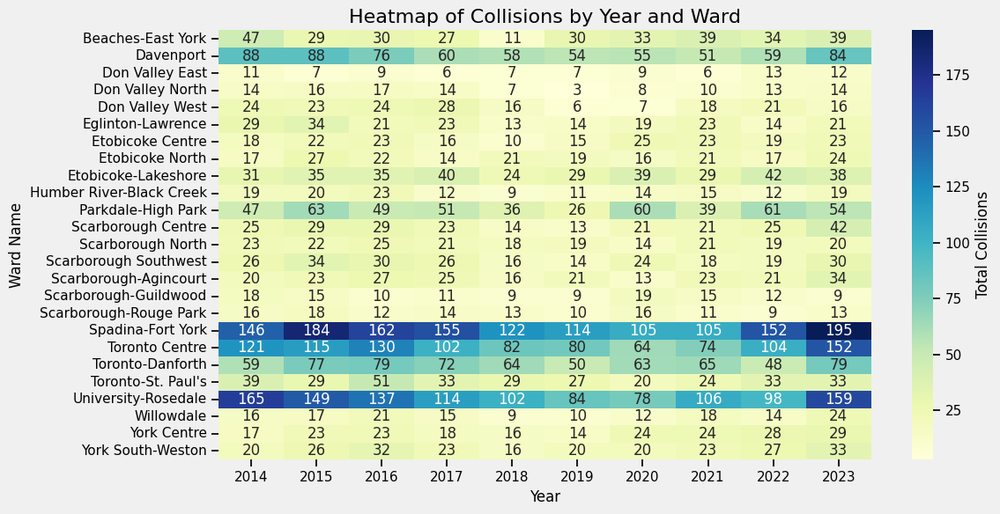

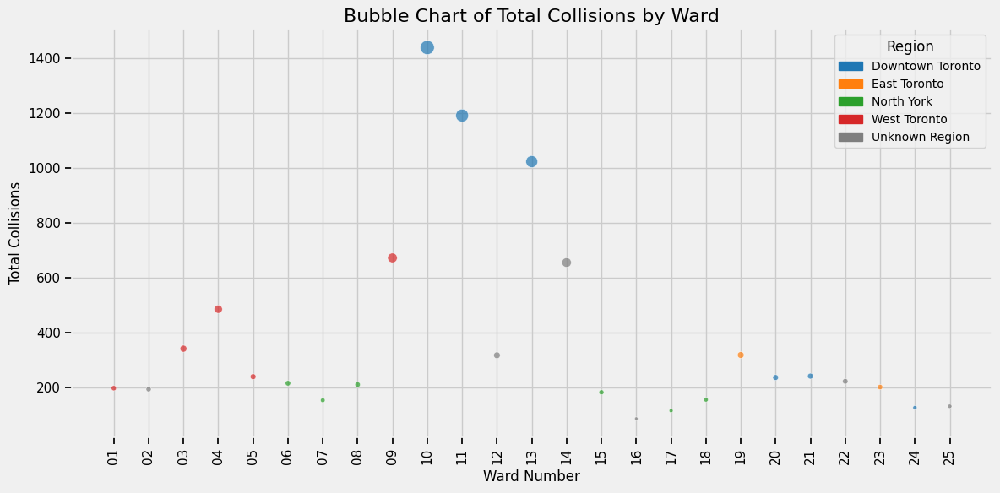

In [33]:
# Grouping by ward and region for the total collision count across all years
general_summary = collision_table.groupby(["Ward Number", "Ward Name", "Region"]).size().reset_index(name="Total Collisions")
general_summary = general_summary.sort_values(by="Ward Number")

# Color mapping for each region
region_colors = {
    "Downtown Toronto": "#1f77b4",  # Blue
    "East Toronto": "#ff7f0e",  # Orange
    "North York": "#2ca02c",  # Green
    "West Toronto": "#d62728",  # Red
    "Unknown Region": "#7f7f7f"  # Grey for unknown regions
}

# 1. **Total Collisions by Ward (All Years)**: General bar chart
plt.figure(figsize=(12, 6))
bars = plt.bar(general_summary["Ward Number"], general_summary["Total Collisions"], 
               color=general_summary['Region'].map(region_colors))
plt.title("Total Collisions by Ward (2014-2023)", fontsize=16)
plt.xlabel("Ward Number", fontsize=12)
plt.ylabel("Number of Collisions", fontsize=12)
plt.xticks(rotation=90)
plt.grid(axis='y', linestyle='--', alpha=0.7)

# Add a legend based on region
handles = [plt.Rectangle((0, 0), 1, 1, color=region_colors[region]) for region in region_colors]
labels = [region for region in region_colors]
plt.legend(handles, labels, title="Region", loc="upper right", fontsize=10)

plt.tight_layout()
plt.show()

# 2. **Collisions by Ward Each Year**: One bar chart per year
for year in range(2014, 2024):  # Updated to cover 2014-2023
    yearly_data = collision_table[collision_table['Year'] == year]
    yearly_summary = yearly_data.groupby(["Ward Number", "Ward Name", "Region"]).size().reset_index(name="Collisions")
    yearly_summary = yearly_summary.sort_values(by="Ward Number")
    
    plt.figure(figsize=(12, 6))
    bars = plt.bar(yearly_summary["Ward Number"], yearly_summary["Collisions"], 
                   color=yearly_summary['Region'].map(region_colors))
    plt.title(f"Collisions by Ward in {year}", fontsize=16)
    plt.xlabel("Ward Number", fontsize=12)
    plt.ylabel("Number of Collisions", fontsize=12)
    plt.xticks(rotation=90)
    plt.grid(axis='y', linestyle='--', alpha=0.7)

    # Add a legend based on region
    handles = [plt.Rectangle((0, 0), 1, 1, color=region_colors[region]) for region in region_colors]
    labels = [region for region in region_colors]
    plt.legend(handles, labels, title="Region", loc="upper right", fontsize=10)

    plt.tight_layout()
    plt.show()

# 3. **Stacked Bar Chart**: Collisions by Ward for each Region, for each year
pivot_table = collision_table.pivot_table(index="Ward Name", columns="Year", values="Ward Number", aggfunc="count", fill_value=0)

# Verify pivot table structure
print(pivot_table.head())  # Check if the pivot table is correct

# Plotting the stacked bar chart
ax = pivot_table.plot(kind='bar', stacked=True, figsize=(14, 7), 
                      color=[region_colors.get(region, "#7f7f7f") for region in collision_table['Region'].unique()])
plt.title("Collisions by Ward (Stacked by Year)", fontsize=16)
plt.xlabel("Ward Name", fontsize=12)
plt.ylabel("Total Collisions", fontsize=12)
plt.xticks(rotation=90)
plt.grid(axis='y', linestyle='--', alpha=0.7)

# Add a legend based on region
handles = [plt.Rectangle((0, 0), 1, 1, color=region_colors[region]) for region in region_colors]
labels = [region for region in region_colors]
plt.legend(handles, labels, title="Region", loc="upper left", fontsize=10)

plt.tight_layout()
plt.show()

# 4. **Heatmap**: To visualize intensity of collisions by Year and Ward
collision_pivot = collision_table.pivot_table(index="Ward Name", columns="Year", values="Ward Number", aggfunc="count", fill_value=0)

# Plotting the heatmap
plt.figure(figsize=(12, 6))
sns.heatmap(collision_pivot, annot=True, fmt='d', cmap="YlGnBu", cbar_kws={'label': 'Total Collisions'})
plt.title("Heatmap of Collisions by Year and Ward", fontsize=16)
plt.xlabel("Year", fontsize=12)
plt.ylabel("Ward Name", fontsize=12)
plt.tight_layout()
plt.show()

# 5. **Bubble Chart**: To visualize the size of collisions with regions color-coded
plt.figure(figsize=(12, 6))
bubble = plt.scatter(general_summary["Ward Number"], general_summary["Total Collisions"],
                     s=general_summary["Total Collisions"] / 10,  # Scale bubble size
                     c=general_summary['Region'].map(region_colors), cmap="viridis", alpha=0.7, edgecolors="w", linewidth=0.5)
plt.title("Bubble Chart of Total Collisions by Ward", fontsize=16)
plt.xlabel("Ward Number", fontsize=12)
plt.ylabel("Total Collisions", fontsize=12)
plt.xticks(rotation=90)

# Add a legend based on region
handles = [plt.Rectangle((0, 0), 1, 1, color=region_colors[region]) for region in region_colors]
labels = [region for region in region_colors]
plt.legend(handles, labels, title="Region", loc="upper right", fontsize=10)

plt.tight_layout()
plt.show()

### Collisions across all Wards every month from 2019 to 2023

To gain a deeper understanding of collision patterns across different wards over time, we will generate both a tabular and visual representation of the number of collisions occurring in each ward per month from 2019 to 2023. The table provides a clear breakdown of collision counts by ward, organized by year and month, offering a detailed view of temporal trends. Following this, a bar graph visually highlights these trends, enabling easy comparison of collision counts across wards and months. These insights are essential for identifying high-risk periods and areas, aiding in targeted road safety interventions and policy-making.

In [43]:
# Ensure the 'DATE' column is in datetime format
collision_table['DATE'] = pd.to_datetime(collision_table['DATE'])

# Extract the month for grouping
collision_table['Month'] = collision_table['DATE'].dt.month

# Group collisions by month (across all years from 2019 to 2023)
overall_monthly_collisions = collision_table.groupby('Month').size().reset_index(name='Number of Collisions')

# Calculate the total number of collisions for the percentage calculation
total_collisions = overall_monthly_collisions['Number of Collisions'].sum()
overall_monthly_collisions['Percentage of Collisions'] = (overall_monthly_collisions['Number of Collisions'] / total_collisions) * 100

# Display the overall table for months
overall_monthly_collisions.head(12)

,Month,Number of Collisions,Percentage of Collisions
0,1,212,2.257000
1,2,185,1.969552
2,3,325,3.460023
3,4,571,6.078995
4,5,987,10.507825
5,6,1240,13.201320
6,7,1260,13.414245
7,8,1293,13.765570
8,9,1298,13.818801
9,10,1001,10.656872


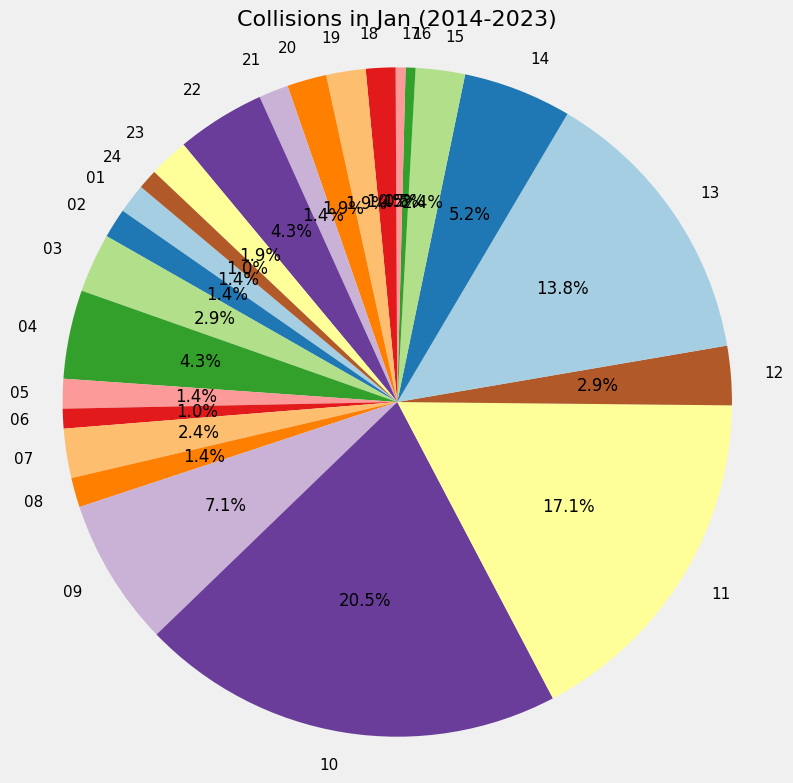

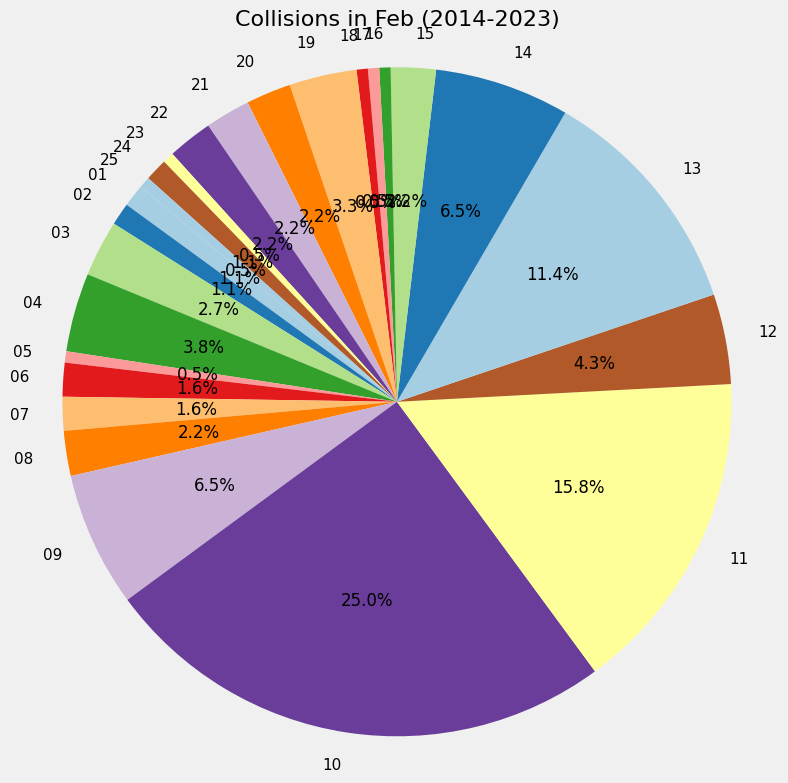

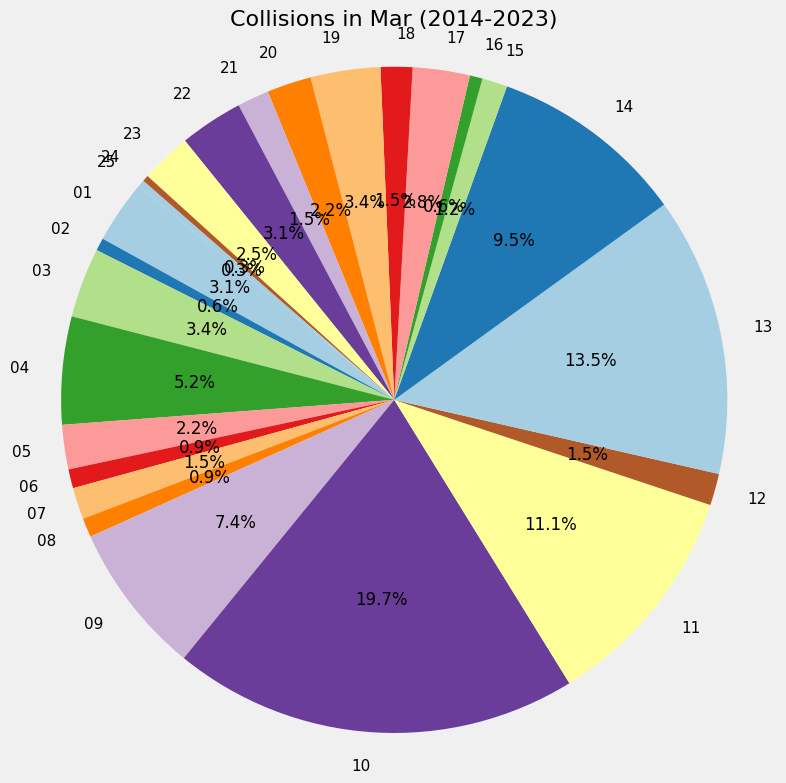

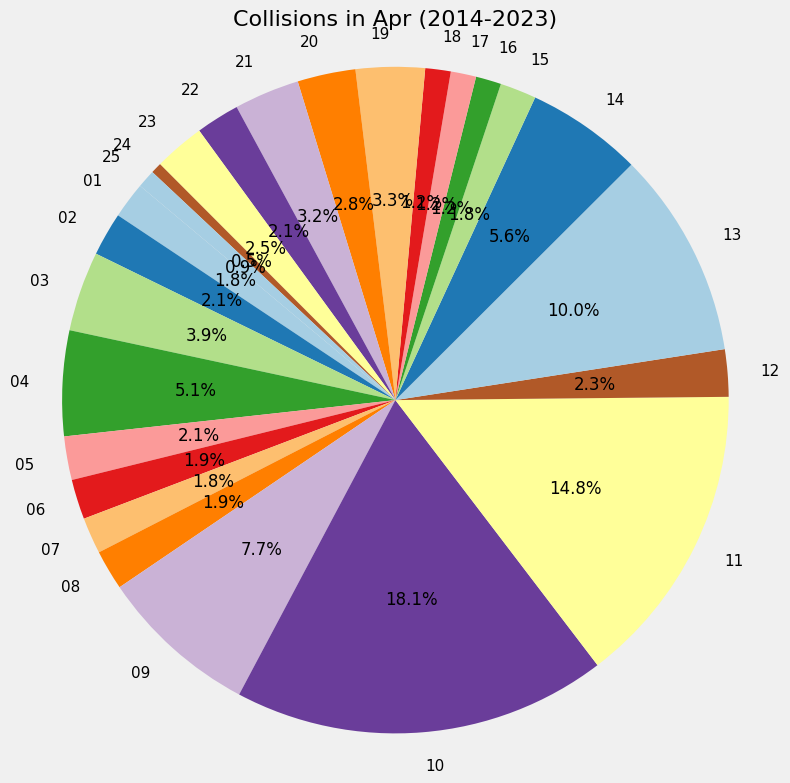

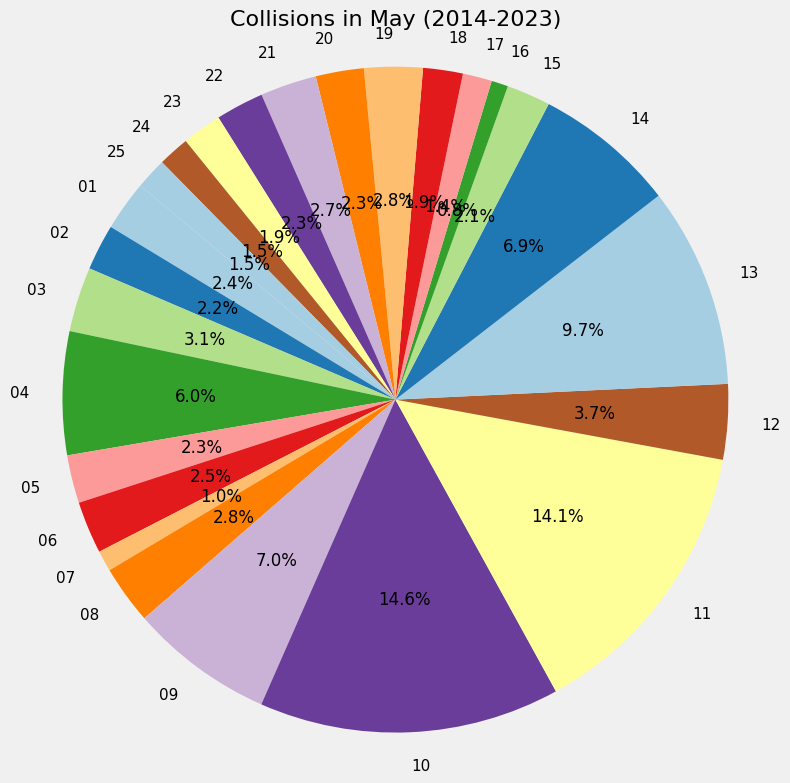

...

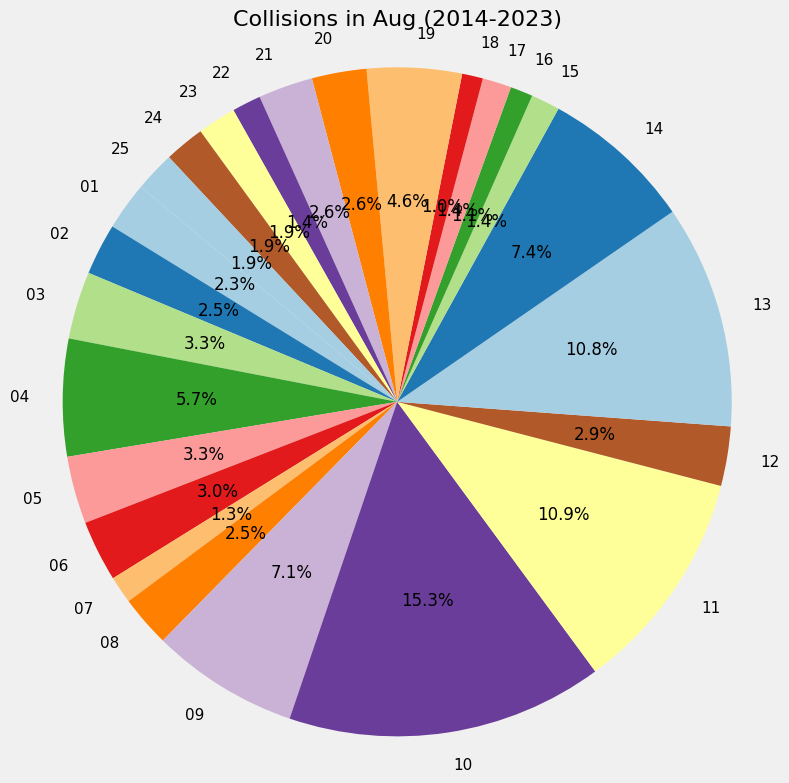

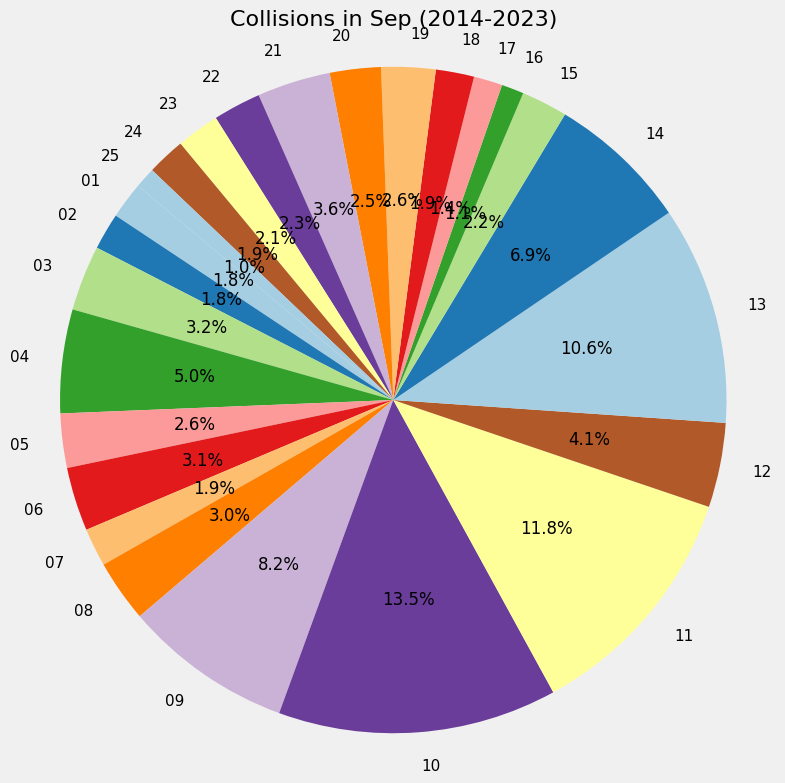

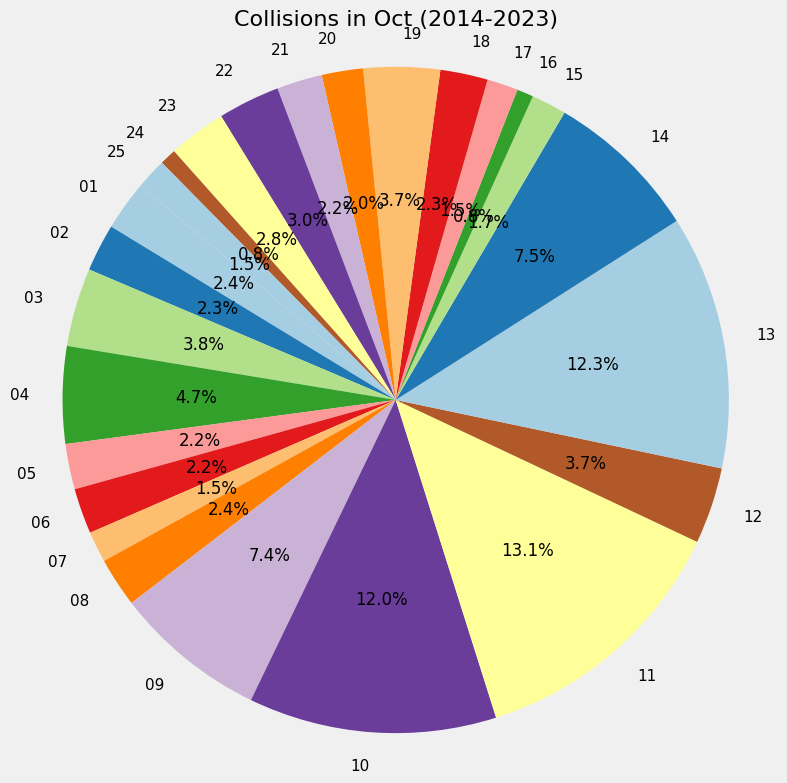

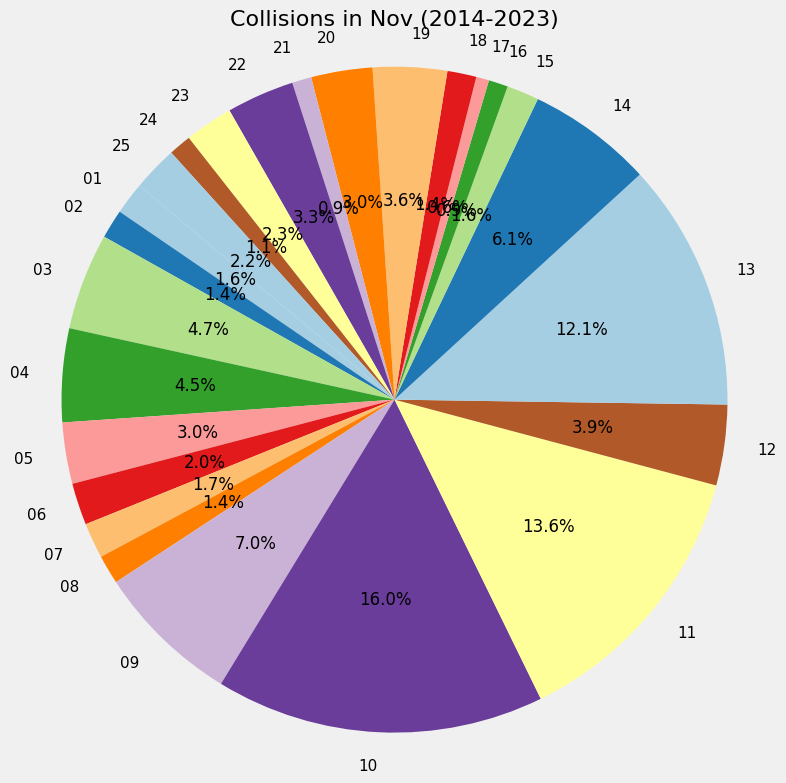

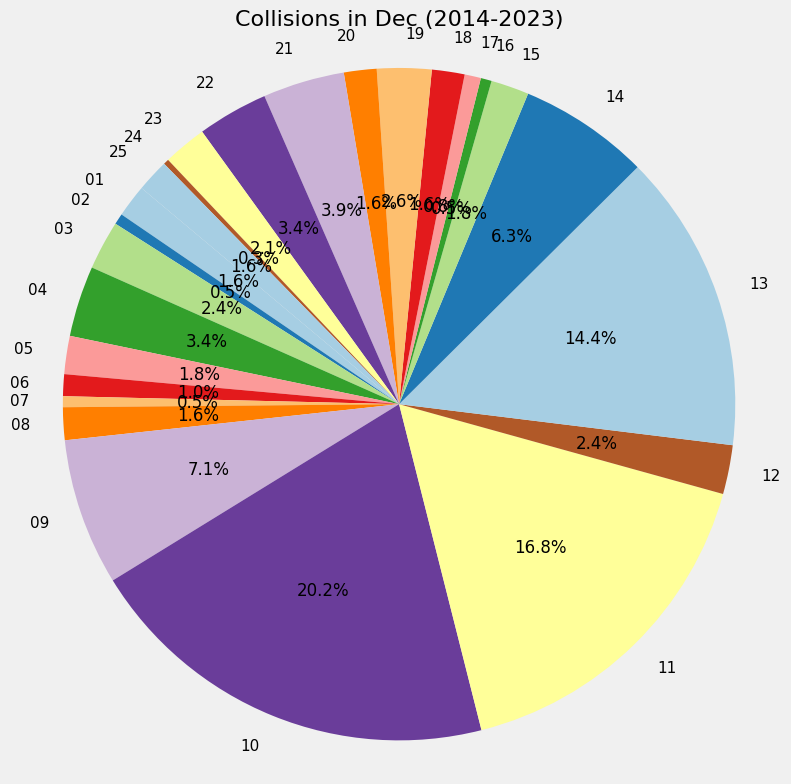

<Figure size 1400x800 with 0 Axes>

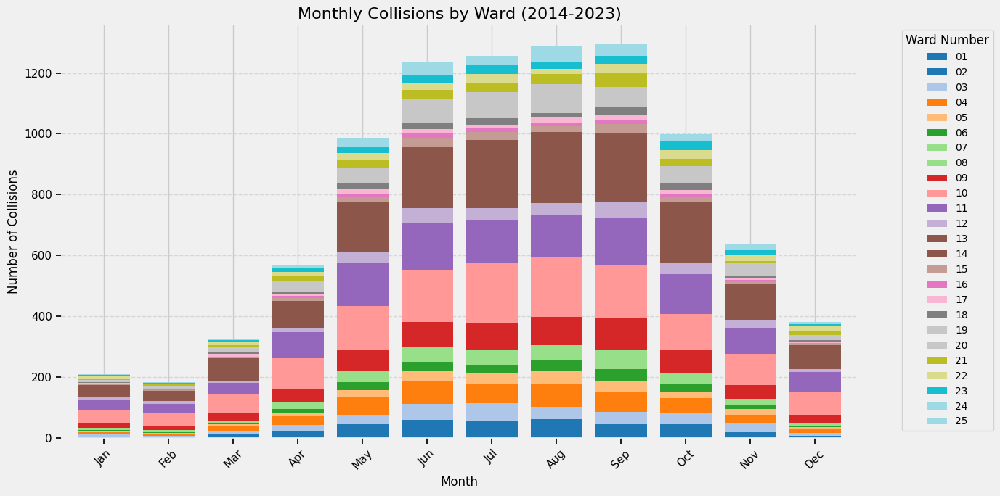

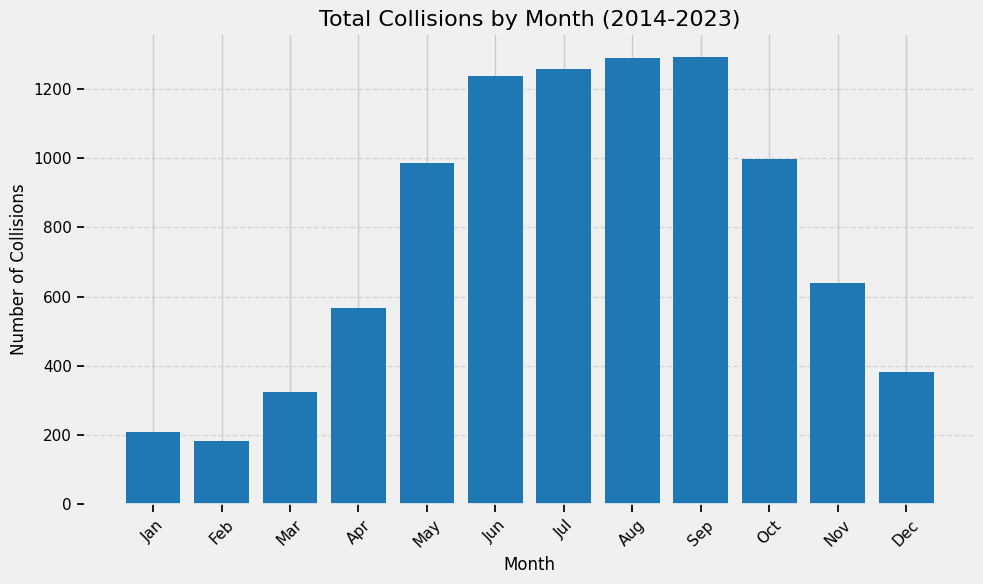

In [37]:
# Group by Ward Number, Month to get the total number of collisions across all years
monthly_collisions_by_ward = collision_table.groupby(['Ward Number', 'Month']).size().reset_index(name='Number of Collisions')

# Generate pie charts for each month, for the total period from 2014 to 2023
months = ['Jan', 'Feb', 'Mar', 'Apr', 'May', 'Jun', 'Jul', 'Aug', 'Sep', 'Oct', 'Nov', 'Dec']

# Pie charts for each month across all wards (aggregated for 2014-2023)
for month in range(1, 13):
    monthly_data = monthly_collisions_by_ward[monthly_collisions_by_ward['Month'] == month]
    monthly_collisions = monthly_data.groupby('Ward Number')['Number of Collisions'].sum().reset_index()

    plt.figure(figsize=(8, 8))
    plt.pie(monthly_collisions['Number of Collisions'], labels=monthly_collisions['Ward Number'], 
            autopct='%1.1f%%', startangle=140, colors=plt.cm.Paired.colors[:len(monthly_collisions)])
    plt.title(f'Collisions in {months[month-1]} (2014-2023)', fontsize=16)
    plt.axis('equal')  # Equal aspect ratio ensures that pie is drawn as a circle.
    plt.tight_layout()
    plt.show()

# Stacked Bar Chart for Monthly Collisions across all years (2014-2023)
# Pivot data so that each ward's collisions per month become columns
pivot_data = monthly_collisions_by_ward.pivot_table(index='Month', columns='Ward Number', values='Number of Collisions', aggfunc='sum', fill_value=0)

# Plotting the stacked bar chart for all months (2014-2023)
plt.figure(figsize=(14, 8))
ax = pivot_data.plot(kind='bar', stacked=True, figsize=(14, 7), colormap='tab20', width=0.8)
plt.title('Monthly Collisions by Ward (2014-2023)', fontsize=16)
plt.xlabel('Month', fontsize=12)
plt.ylabel('Number of Collisions', fontsize=12)
plt.xticks(range(12), months, rotation=45)
plt.grid(axis='y', linestyle='--', alpha=0.7)

# Add the legend to the stacked bar chart (each color corresponds to a ward)
plt.legend(title="Ward Number", bbox_to_anchor=(1.05, 1), loc='upper left', fontsize=10)

plt.tight_layout()
plt.show()

# Overall Monthly Collisions (2014-2023)
overall_monthly_collisions = monthly_collisions_by_ward.groupby('Month')['Number of Collisions'].sum().reset_index()

# Plot the overall collisions by month across all wards
plt.figure(figsize=(10, 6))
plt.bar(overall_monthly_collisions['Month'], overall_monthly_collisions['Number of Collisions'], color='#1f77b4')
plt.title('Total Collisions by Month (2014-2023)', fontsize=16)
plt.xlabel('Month', fontsize=12)
plt.ylabel('Number of Collisions', fontsize=12)
plt.xticks(range(1, 13), months, rotation=45)
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.tight_layout()
plt.show()

### Collisions Across all Wards Day of the Week

In [40]:
# Ensure the 'DATE' column is in datetime format
collision_table['DATE'] = pd.to_datetime(collision_table['DATE'])

# Extract the day of the week for grouping
collision_table['Day of Week'] = collision_table['DATE'].dt.day_name()

# Group collisions by day of the week (across all years from 2019 to 2023)
overall_daily_collisions = collision_table.groupby('Day of Week').size().reset_index(name='Number of Collisions')

# Calculate the total number of collisions for the percentage calculation
total_collisions = overall_daily_collisions['Number of Collisions'].sum()
overall_daily_collisions['Percentage of Collisions'] = (overall_daily_collisions['Number of Collisions'] / total_collisions) * 100

# Sort the days of the week in chronological order
day_order = ['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday']
overall_daily_collisions['Day of Week'] = pd.Categorical(overall_daily_collisions['Day of Week'], categories=day_order, ordered=True)
overall_daily_collisions = overall_daily_collisions.sort_values('Day of Week')

# Display the overall table for days of the week
overall_daily_collisions.head(7)

,Day of Week,Number of Collisions,Percentage of Collisions
1,Monday,32100,13.214444
5,Tuesday,36520,15.034004
6,Wednesday,37141,15.289647
4,Thursday,38402,15.808757
0,Friday,40601,16.714008
2,Saturday,32502,13.379934
3,Sunday,25650,10.559206


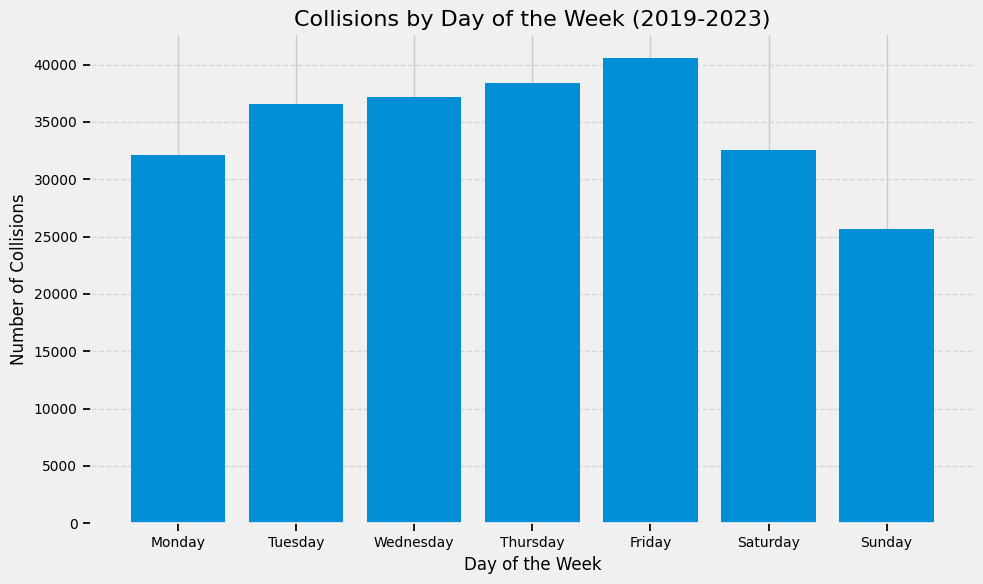

In [41]:
# Plot collisions by day of the week
plt.figure(figsize=(10, 6))
plt.bar(overall_daily_collisions['Day of Week'], overall_daily_collisions['Number of Collisions'])
plt.title('Collisions by Day of the Week (2019-2023)', fontsize=16)
plt.xlabel('Day of the Week', fontsize=12)
plt.ylabel('Number of Collisions', fontsize=12)
plt.xticks(fontsize=10)
plt.yticks(fontsize=10)
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.tight_layout()
plt.show()

In [42]:
# Ensure the 'DATE' column is in datetime format
collision_table['DATE'] = pd.to_datetime(collision_table['DATE'])

# Extract the day of the week
collision_table['Day of Week'] = collision_table['DATE'].dt.day_name()

# Group collisions by Ward Number and Day of the Week
ward_daily_collisions = collision_table.groupby(['Ward_Number', 'Day of Week']).size().reset_index(name='Number of Collisions')

# Pivot the table so days of the week are columns and wards are rows
ward_daily_pivot = ward_daily_collisions.pivot(index='Ward_Number', columns='Day of Week', values='Number of Collisions').fillna(0)

# Sort columns (days of the week) in chronological order
day_order = ['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday']
ward_daily_pivot = ward_daily_pivot[day_order]

# Add a total column for each ward
ward_daily_pivot['Total Collisions'] = ward_daily_pivot.sum(axis=1)

# Display the table for collisions by ward
ward_daily_pivot.head(25)  

Day of Week,Monday,Tuesday,Wednesday,Thursday,Friday,Saturday,Sunday,Total Collisions
Ward_Number,,,,,,,,
01,1633,1632,1671,1782,1949,1479,1179,11325
02,920,1057,1090,1152,1101,808,654,6782
03,1617,1826,1867,1866,2012,1619,1254,12061
04,1101,1365,1375,1487,1442,1326,1051,9147
05,1276,1502,1573,1592,1811,1463,1213,10430
06,1523,1752,1690,1748,1919,1440,1092,11164
07,1208,1300,1412,1410,1607,1150,973,9060
08,1331,1547,1509,1677,1553,1237,993,9847
09,1044,1158,1213,1375,1404,1224,966,8384


### Collisions across all Ward for Time of Day

In [43]:
# Group collisions by time of the day
time_of_day_collisions = collision_table.groupby('TIME_OF_DAY').size().reset_index(name='Number of Collisions')

# Calculate the total number of collisions for the percentage calculation
total_collisions = time_of_day_collisions['Number of Collisions'].sum()
time_of_day_collisions['Percentage of Collisions'] = (time_of_day_collisions['Number of Collisions'] / total_collisions) * 100

# Sort the time of day categories in logical order
time_order = ['Morning (5 AM - 12 PM)', 'Afternoon (12 PM - 5 PM)', 'Evening (5 PM - 9 PM)', 'Night (9 PM - 5 AM)']
time_of_day_collisions['TIME_OF_DAY'] = pd.Categorical(time_of_day_collisions['TIME_OF_DAY'], categories=time_order, ordered=True)
time_of_day_collisions = time_of_day_collisions.sort_values('TIME_OF_DAY')

time_of_day_collisions.head(7)

,TIME_OF_DAY,Number of Collisions,Percentage of Collisions
2,Morning (5 AM - 12 PM),67405,27.748275
0,Afternoon (12 PM - 5 PM),88701,36.515092
1,Evening (5 PM - 9 PM),55517,22.854402
3,Night (9 PM - 5 AM),31293,12.882231


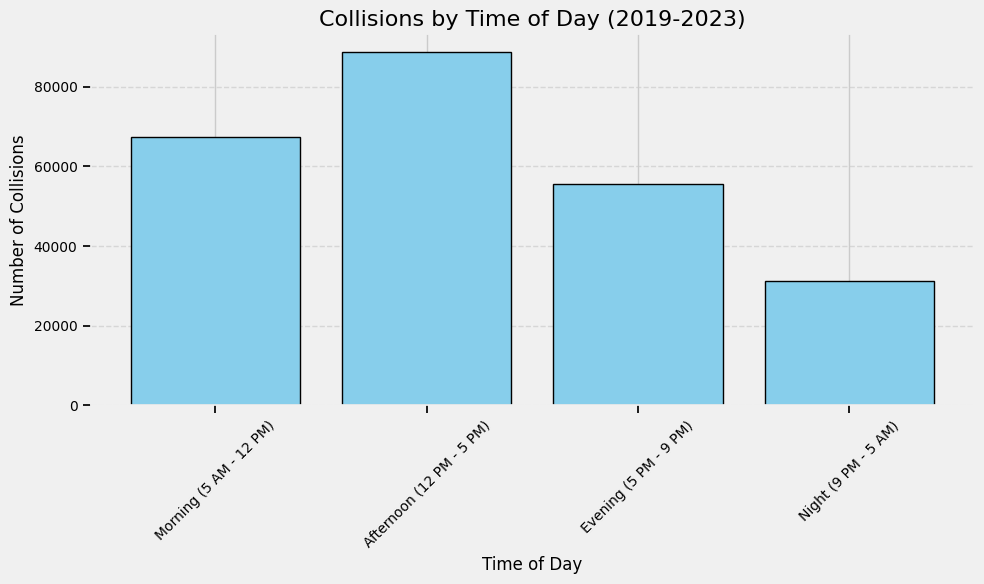

In [44]:
# Plot collisions by time of the day
plt.figure(figsize=(10, 6))
plt.bar(
    time_of_day_collisions['TIME_OF_DAY'], 
    time_of_day_collisions['Number of Collisions'], 
    color='skyblue', 
    edgecolor='black'
)

# Add a title and labels
plt.title('Collisions by Time of Day (2019-2023)', fontsize=16)
plt.xlabel('Time of Day', fontsize=12)
plt.ylabel('Number of Collisions', fontsize=12)

# Customize tick labels
plt.xticks(fontsize=10, rotation=45)
plt.yticks(fontsize=10)

# Add grid lines for better readability
plt.grid(axis='y', linestyle='--', alpha=0.7)

# Adjust layout for better fit
plt.tight_layout()

# Display the plot
plt.show()